# Preprocesamiento de Imágenes

### librerias

In [12]:
from pathlib import Path
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
import logging


## Definir rutas 

In [13]:
# Rutas
input_base_path = Path('../data/processed/augmented')
output_base_path = Path('../data/processed/preprocessed_potato_leaf')
output_base_path.mkdir(parents=True, exist_ok=True)

## Funciones para redireccionar el tamaño de las imagenes 

In [14]:
def rename_and_resize_images(input_path, output_path, target_size=(224, 224)):
    renamed_images = {}
    
    for class_folder in input_path.iterdir():
        if class_folder.is_dir():
            class_output = output_path / class_folder.name
            class_output.mkdir(parents=True, exist_ok=True)
            
            image_count = 1  # Iniciar el conteo por categoría
            
            renamed_images[class_folder.name] = []
            
            for img_file in class_folder.glob('*'):
                if img_file.suffix.lower() in ['.jpg', '.jpeg', '.png']:
                    try:
                        with Image.open(img_file) as img:
                            img_resized = img.resize(target_size)
                            
                            # Asignar nombres únicos por categoría
                            new_name = f"imagen_{image_count:04d}{img_file.suffix}"
                            new_path = class_output / new_name
                            
                            img_resized.save(new_path)
                            renamed_images[class_folder.name].append((img, img_resized, str(new_path)))
                            
                            image_count += 1
                            logging.info(f"Procesada con éxito: {img_file} -> {new_path}")
                    except Exception as e:
                        logging.error(f"Error procesando {img_file}: {str(e)}")
    
    return renamed_images

## Funcion para  contraste y ajuste

In [15]:
def apply_preprocessing(image):
    try:
        # Ajustar contraste y brillo
        enhancer = ImageEnhance.Contrast(image)
        image_contrast = enhancer.enhance(1.2)
        enhancer = ImageEnhance.Brightness(image_contrast)
        adjusted = enhancer.enhance(1.1)
        
        return image, adjusted
    except Exception as e:
        logging.error(f"Error en el preprocesamiento: {str(e)}")
        return None, None

In [16]:
def plot_preprocessing_steps(original, resized, _, adjusted, title):
    try:
        fig, axes = plt.subplots(2, 2, figsize=(6, 6))
        fig.suptitle(title, fontsize=12)
        
        axes[0, 0].imshow(original)
        axes[0, 0].set_title('Original')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(resized)
        axes[0, 1].set_title('Redimensionada')
        axes[0, 1].axis('off')
        
        axes[1, 0].imshow(resized)
        axes[1, 0].set_title('Sin reducción de ruido')
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(adjusted)
        axes[1, 1].set_title('Ajuste de contraste y brillo')
        axes[1, 1].axis('off')
        
        plt.tight_layout()
        plt.show()
    except Exception as e:
        logging.error(f"Error al mostrar las imágenes: {str(e)}")

#### Redimensionar imágenes

In [17]:
# Redimensionar imágenes y renombrar por categoría
renamed_images_by_category = rename_and_resize_images(input_base_path, output_base_path)



# Visualizar las Imágenes procesadas

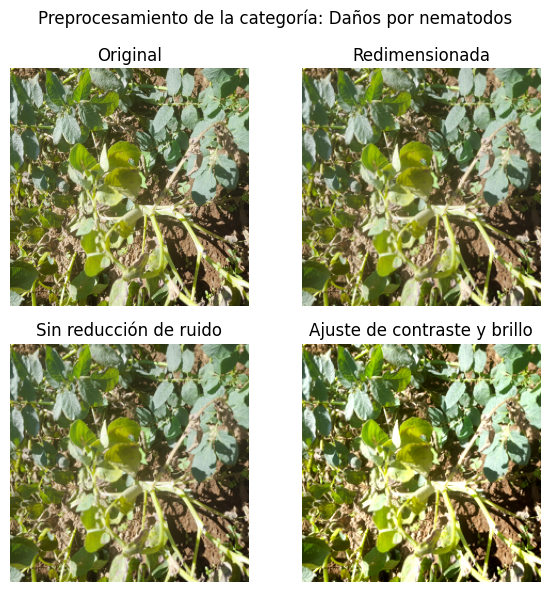

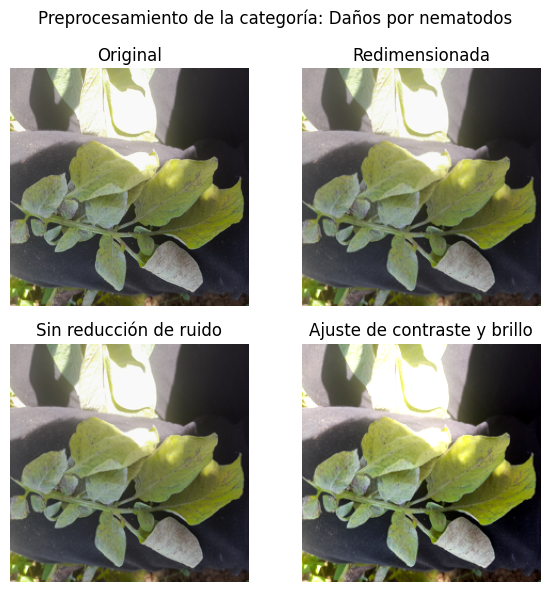

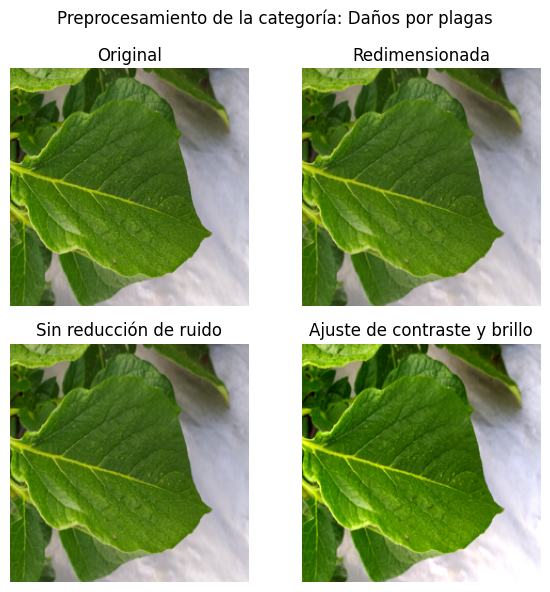

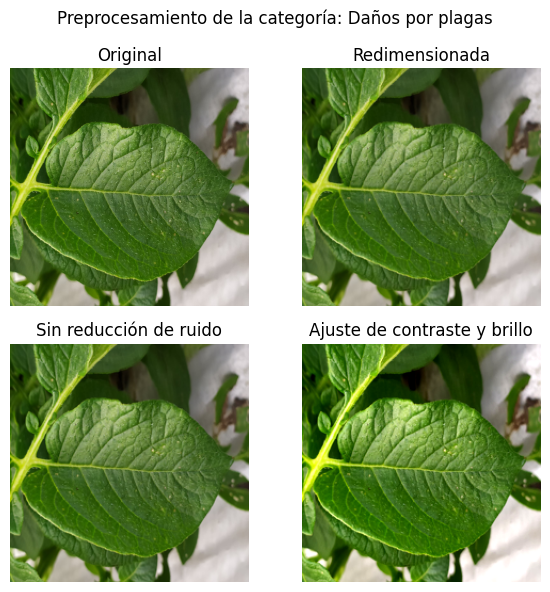

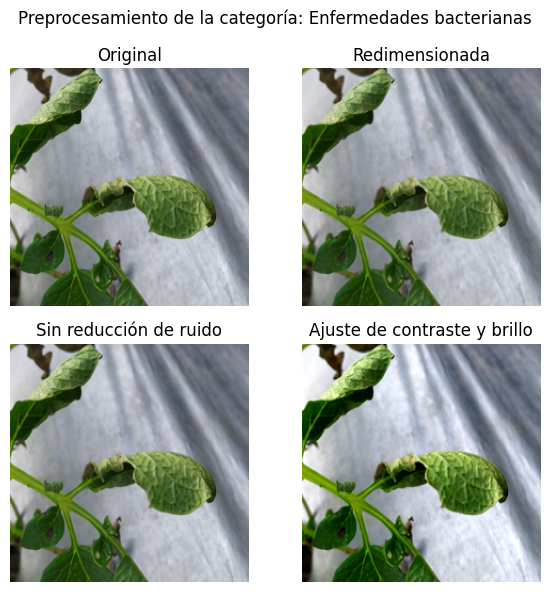

...

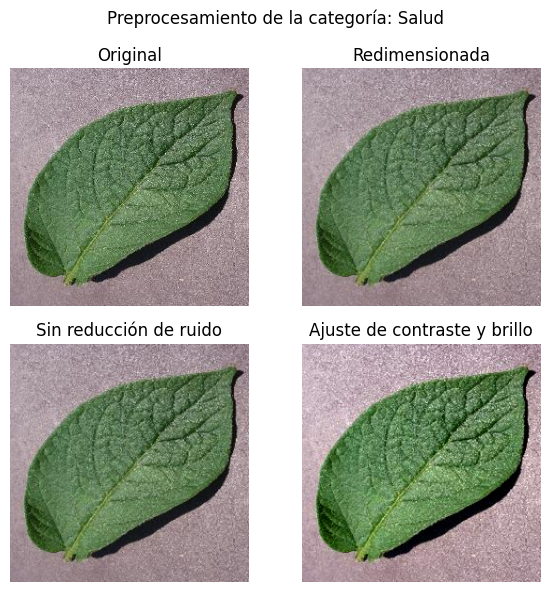

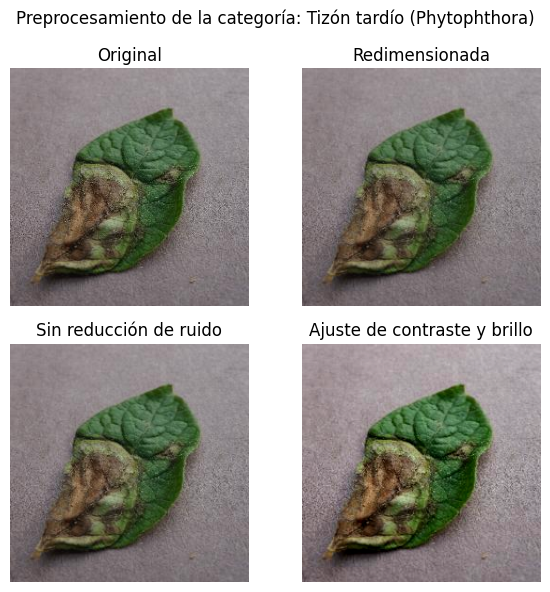

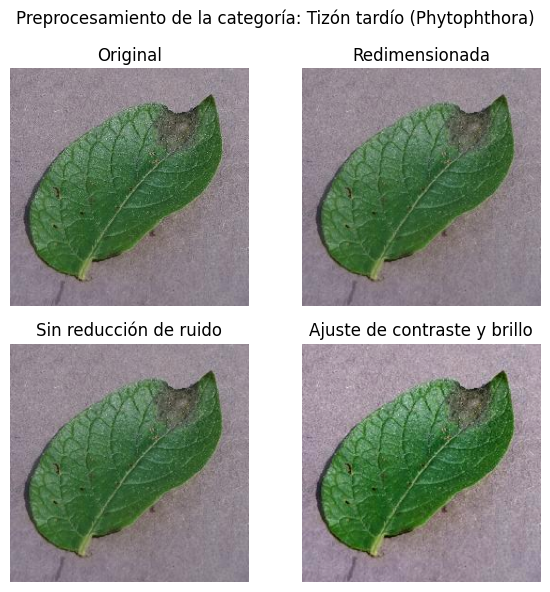

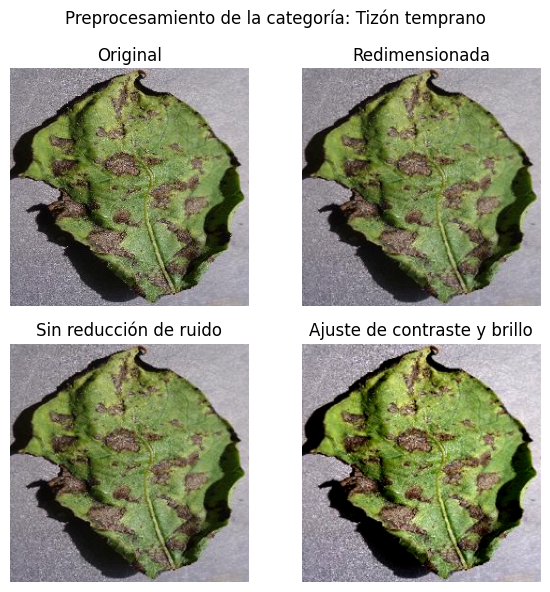

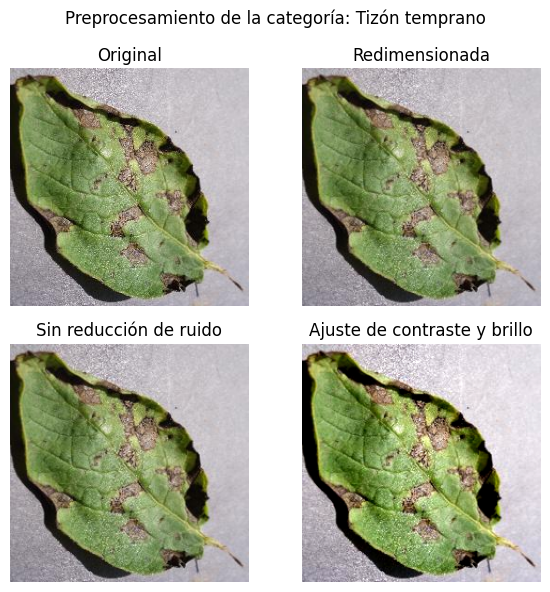

In [18]:
# Procesar imágenes y mostrar comparaciones para cada categoría
for category, renamed_images in renamed_images_by_category.items():
    logging.info(f"Procesando imágenes para la categoría: {category}")
    for original, resized, path in renamed_images[:2]:  
        _, adjusted = apply_preprocessing(resized)
        if adjusted is not None:
            plot_preprocessing_steps(original, resized, resized, adjusted, f"Preprocesamiento de la categoría: {category}")
        else:
            logging.warning(f"No se pudo preprocesar la imagen: {path}")


# Guardar los cambios 

In [19]:
# Guardar automáticamente las imágenes procesadas
logging.info("Guardando imágenes procesadas automáticamente...")
for category, renamed_images in renamed_images_by_category.items():
    for _, resized, path in renamed_images:
        _, processed = apply_preprocessing(resized)
        if processed is not None:
            processed.save(path)
            logging.info(f"Guardada imagen procesada: {path}")
        else:
            logging.warning(f"No se pudo guardar la imagen procesada: {path}")

logging.info(f"Todas las imágenes procesadas han sido guardadas en {output_base_path}")

print("alexander.py")


alexander.py


# Renombrar las imagenes 

In [20]:
import os

def renombrar_imagenes(directorio):
   
    # Verificar si el directorio existe
    if not os.path.isdir(directorio):
        print(f"Error: El directorio '{directorio}' no existe.")
        return
    
    # Recorrer todos los directorios y subdirectorios
    for root, dirs, files in os.walk(directorio):
        for nombre_archivo in files:
            ruta_archivo = os.path.join(root, nombre_archivo)
            
            # Separar el nombre y la extensión
            nombre, extension = os.path.splitext(nombre_archivo)
            
            # Convertir la extensión a minúsculas
            if extension.lower() == '.jpg':
                nueva_extension = '.jpg'
                
                if extension != nueva_extension:
                    nuevo_nombre_archivo = nombre + nueva_extension
                    nueva_ruta_archivo = os.path.join(root, nuevo_nombre_archivo)
                    
                    # Renombrar el archivo
                    os.rename(ruta_archivo, nueva_ruta_archivo)
    



In [21]:
# Ruta del directorio principal que contiene las imágenes y subdirectorios
directorio_principal ='../data/processed/preprocessed_potato_leaf'

# Llamar a la función para renombrar las imágenes
renombrar_imagenes(directorio_principal)